# Example Python Scripting for ELEMENTS Backend and Geospatial Analytics
#### *This script was create by Matthew Schmitt for the RAA ELEMENTS Hands on Session (Febuary 15th, 2016). Please send specific scripting questions to <Matthew.Schmitt@aonbenfield.com>.*
___
## Table of Contents
   + [Import Libraries](#lib)
   + [Set up DB Connections](#db)
   + [Import DB to Dataframe](#df)
   + [Messing around with the data](#dfstats)
   + [Geospatial Analytics](#geo)
       + [States](#st)
       + [Zips](#zip)
   + [To-do list](#todo)


### Importing the Libraries <a id="lib"></a>
*Python is an incredibly testy enviornment to work with outside of unix systems. For this matter I suggest you install Anaconda [link](http://docs.continuum.io/anaconda/install) and work from there. Setting up a virtual environment is recommended. The spatial libraries needed will be imported later...*

In [1]:
%matplotlib inline
import pyodbc, os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_rows', 10)
pd.set_option('precision', 4)
pd.set_option('expand_frame_repr', True)

### Setting up DB connections <a id="db"></a>
*You will have to tailor some of these variables to your specific ELEMENTS set-up. Please visit [Impact Forecasting's support site](https://support.impactforecasting.com/) or emial: <ifsupport@aonbenfield.com>*

*Please be aware that for the sake of this tutorial I have used XXXX for the password and the user for security reasons...*

In [2]:
# The easiest way to connect to SQL Server is through pyodbc, other ways to connect include SQL Alchemy and if you wanted to
# use PostGIS to store the spatial data we'd probably want to use psycopg2...
dbstr = 'DRIVER={SQL Server};SERVER=nachiifrd001\\rd;UID=XXXXX;PWD=XXXXX'
dbcon = pyodbc.connect(dbstr)

In [4]:
# Here's our project name and portfolio information for the run that we did for 100m gridded AAL for the Hydro Unit 07...
projectname = 'mrs_aal_huc07'
portfolioid = 2
analysisid = 3
# This SQL query was made specifically to pull out Ground Up Average Annual Loss, 
# please contact the author or IF support for help customizing this script for your intended purposes..
sql = "SELECT Prop.PropertyID, PROP.ExtPropertyID, ADDR.StateAbbreviation, NumOfStories, YearBuilt, BuildingType, OccupancyType, BasementClass, Addrmatch, Addr.Latitude/1000000. GeoLat, ADDR.Longitude/1000000. GeoLon, ADDR.PostalCode GeoZip, Elevation Elevation_cm ,SITE.STR_TIV, SITE.CON_TIV, SITE.TE_TIV, AAL.GU GU_AAL FROM (SELECT * FROM IF_EXP_%s.dbo.property WHERE PortfolioID = %i) PROP FULL JOIN (SELECT * FROM IF_EXP_%s.dbo.site WHERE PortfolioID = %i) SITE ON PROP.ExtPropertyID = Site.ExtSiteID FULL JOIN (SELECT * FROM IF_EXP_%s.dbo.Address WHERE PortfolioID = %i) ADDR ON PROP.EXTPropertyID = ADDR.ExtPropertyID FULL JOIN (SELECT * FROM IF_RES_%s.dbo.PML WHERE PMLLevelType = 'LOCATION' AND AnalysisRunID = %i AND RetPeriod = 0) AAL ON AAL.RefID = PROP.PropertyID" % (projectname,portfolioid,projectname,portfolioid,projectname,portfolioid,projectname,analysisid) 
print sql

SELECT Prop.PropertyID, PROP.ExtPropertyID, ADDR.StateAbbreviation, NumOfStories, YearBuilt, BuildingType, OccupancyType, BasementClass, Addrmatch, Addr.Latitude/1000000. GeoLat, ADDR.Longitude/1000000. GeoLon, ADDR.PostalCode GeoZip, Elevation Elevation_cm ,SITE.STR_TIV, SITE.CON_TIV, SITE.TE_TIV, AAL.GU GU_AAL FROM (SELECT * FROM IF_EXP_mrs_aal_huc07.dbo.property WHERE PortfolioID = 2) PROP FULL JOIN (SELECT * FROM IF_EXP_mrs_aal_huc07.dbo.site WHERE PortfolioID = 2) SITE ON PROP.ExtPropertyID = Site.ExtSiteID FULL JOIN (SELECT * FROM IF_EXP_mrs_aal_huc07.dbo.Address WHERE PortfolioID = 2) ADDR ON PROP.EXTPropertyID = ADDR.ExtPropertyID FULL JOIN (SELECT * FROM IF_RES_mrs_aal_huc07.dbo.PML WHERE PMLLevelType = 'LOCATION' AND AnalysisRunID = 3 AND RetPeriod = 0) AAL ON AAL.RefID = PROP.PropertyID


### Pulling to dataframe using Pandas <a id="df"></a>
*Now that we have the information in a SQL string, it's easy to use the pandas module to pull into a dataframe using the DB connection*

In [5]:
# Pandas uses the SQL string and the connection string we created in the cells above to pull from the ELEMENTS DB.
%time data = pd.read_sql(sql, dbcon)
# Print the number of rows, or the length of the data frame
print "Total Policies in Analysis: "+ str('{:,.2f}'.format(len(data)))
print "Total Policies with GU AAL: " + str('{:,.2f}'.format(data.GU_AAL.count()))
print "Percent of Portfolio with GU AAL: " + str('{:,.2f}'.format((float(data.GU_AAL.count())/float(len(data)))*100)) + "%"
# Show the data
data.head(2)

Wall time: 1min 24s
Total Policies in Analysis: 2,978,409.00
Total Policies with GU AAL: 2,229,920.00
Percent of Portfolio with GU AAL: 74.87%


,PropertyID,ExtPropertyID,StateAbbreviation,NumOfStories,YearBuilt,BuildingType,OccupancyType,BasementClass,Addrmatch,GeoLat,GeoLon,GeoZip,Elevation_cm,STR_TIV,CON_TIV,TE_TIV,GU_AAL
0,10034,2869173,WI,0.00,1980,WD,R,UNK,1,44.95,-90.93,54768,32325,"100,000.00","50,000.00","20,000.00",159.07
1,10102,2869241,IA,0.00,1980,WD,R,UNK,1,43.12,-91.30,52159,21904,"100,000.00","50,000.00","20,000.00","6,273.22"


*The final column is our Ground Up Average Annual Loss as calculated in elements (GU_AAL). It has a version of NULL specific to pandas and numpy which is NaN. This value is harmless if using pandas or numpy, but if you wanted to compute statistics and have them include the NaN as 0 values, then it's easier to change it (you can specify this in certain functions, but for the sake of clarity it's easier to change it now). I'm going to clean up the Dataframe to my personal liking:*

In [6]:
# NOTE: YOU MAY WANT TO KEEP PROPERTYID AND EXTPROPERTYID BECAUSE THEY ARE THE KEY TO YOUR PORTFOLIO
data = data.drop(['PropertyID','ExtPropertyID','YearBuilt','BasementClass','Addrmatch','NumOfStories','OccupancyType','BuildingType'], axis=1)
# Lowercase the columns, it's a personal habit of mine...
data.columns = map(str.lower, data.columns)
# Change all NaNs to 0 (useful before loading to a db)
data = data.fillna(0)
data.head(3)

,stateabbreviation,geolat,geolon,geozip,elevation_cm,str_tiv,con_tiv,te_tiv,gu_aal
0,WI,44.95,-90.93,54768,32325,"100,000.00","50,000.00","20,000.00",159.07
1,IA,43.12,-91.30,52159,21904,"100,000.00","50,000.00","20,000.00","6,273.22"
2,WI,44.05,-90.16,54646,28102,"100,000.00","50,000.00","20,000.00",0.10


*Now we can go ahead and elemenate the individual columns for insured values by adding them together, then we can use that total insured value (TIV) column to calculate the loss cost for the point. For this example we're going to make the loss cost easier to read as dollar amount per $1,000 USD...*

In [7]:
# Column adding into a new column
data['tottiv']=data['str_tiv']+data['con_tiv']+data['te_tiv']
# Calculate loss cost per $1,000 dollars...
data['lscst_1k']=(data['gu_aal']/data['tottiv'])*1000
data = data.drop(['str_tiv','con_tiv','te_tiv'], axis=1)
data.head(3)

,stateabbreviation,geolat,geolon,geozip,elevation_cm,gu_aal,tottiv,lscst_1k
0,WI,44.95,-90.93,54768,32325,159.07,"170,000.00",0.94
1,IA,43.12,-91.30,52159,21904,"6,273.22","170,000.00",36.90
2,WI,44.05,-90.16,54646,28102,0.10,"170,000.00",0.00


### Some Useful Statistics <a id="dfstats"></a>
*Once we have the two columns created and the dataframe cleaned, we can start doing some simple aggregation and pivot tables with pandas, this will be expanded on later when we add in a geospatial aspect*

In [8]:
# Let's describe the dataframe... 
# NOTE: You can use the method .describe() to get this information very quickly as well
print "Ground up AAL:"
print "Max: "+str('${:,.2f}'.format(data.gu_aal.max()))
print "Standard Deviation: "+str('${:,.2f}'.format(data.gu_aal.std()))
print "Variance: "+str('${:,.2f}'.format(data.gu_aal.var()))
print '\n'
# The loss cost is per $1,000 dollars, we can get some summary statistics with the following:
print "Loss Cost per $1,000:"
print "Max: " + str('${:,.2f}'.format(data.lscst_1k.max()))
print "Standard Deviation: " + str('${:,.2f}'.format(data.lscst_1k.std()))
print "Variance: " + str('${:,.2f}'.format(data.lscst_1k.var()))

Ground up AAL:
Max: $37,926.86
Standard Deviation: $3,598.41
Variance: $12,948,552.48


Loss Cost per $1,000:
Max: $223.10
Standard Deviation: $21.17
Variance: $448.05


In [9]:
# We can use to groupby method to get descriptions for each individual state and aggregate
stdf = data[['stateabbreviation','gu_aal','lscst_1k']].groupby('stateabbreviation').sum()
stdf

,gu_aal,lscst_1k
stateabbreviation,,
IA,"975,661,541.16","5,739,185.54"
IL,"1,138,486,239.20","6,696,977.88"
IN,"22,919,659.22","134,821.52"
KY,"1,208,334.91","7,107.85"
MN,"543,613,314.77","3,197,725.38"
MO,"717,634,815.95","4,221,381.27"
SD,"7,631,859.76","44,893.29"
WI,"492,269,820.83","2,895,704.83"


### Geospatial Analysis <a id="geo"></a>
*This section will run through some basic geospatial operations in python using a few open-source libraries. Some people might prefer ESRI's arcpy module, but I personally like the open-source community.*

* Install required packages (on Windows, use [binaries from here](http://www.lfd.uci.edu/~gohlke/pythonlibs/) for `shapely`, `pyproj`, `rasterio`, and others)

* Initial Setup Notes for Windows [good walkthrough here](https://github.com/SpatialPython/spatial_python/blob/master/install.md)
   * Download and install GDAL [from here](http://www.lfd.uci.edu/~gohlke/pythonlibs/#gdal)
   * If you use this one, then you can also use the `fiona` binary from that site. Otherwise, you'll have to play around with system PATHs etc. Others have had success with [OSGeo4W](http://trac.osgeo.org/osgeo4w/), which includes many important libraries and their Python bindings.


In [41]:
%matplotlib inline
import folium
import fiona.crs
import geopandas as gpd
from itertools import chain
from shapely.geometry import Point
from matplotlib.colors import Normalize
import pandas as pd, numpy as np, matplotlib.pyplot as plt, matplotlib.font_manager as fm
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (10.0, 8.0)

*If all you wanted to do was create a shapefile from your point data you could run the following code. Please note that this is incredibly memory intensive. The output is a shapely geometry point, which we will then recombine into a Geodataframe or a Geoseries.*

*Some benchmarks: 500,000 points took 14.4s | 2,300,000 points took 65.4s*

In [ ]:
# Convert geometry
%time geometry = [Point(xy) for xy in zip(df.geolon, df.geolat)]
# Combine that into a geospatial DF from geopandas and you'll see there's now a geometry column
geo_df = gpd.GeoDataFrame(df,crs=fiona.crs.from_epsg(4326), geometry=geometry)
# If you wanted to output the file right now as a geojson you could run this code:
with open('aal_points.geojson', 'w') as f:
    f.write(geo_df.to_json())
# Or you could just save it as a Shapefile:
geo_df.to_file('aal_points.shp')
# Note, it truncated my attribute name because they were too long for the shapefile format

The following section we'll import a few shapefiles of the US and build some basic maps with different libraries, there's a good resource for GeoJSON's [here](https://github.com/jgoodall/us-maps) and you can download the shapefiles yourself if you want.

##### States Analysis <a id="st"></a>

In [47]:
# Import the US states geojson file:
filename = os.path.join('data', 'state.zip')
state_shp = gpd.read_file('/state.json', vfs='zip://' + filename)
print(type(state_shp))

<class 'geopandas.geodataframe.GeoDataFrame'>


In [13]:
# Let's look at the coordinate system...
state_shp.crs

{'init': u'epsg:4326'}

[u'WI' u'IA' u'IL' u'MO' u'MN' u'IN' u'SD' u'KY']


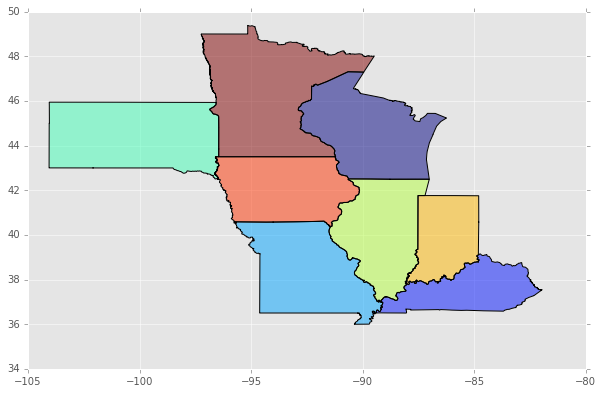

In [15]:
# Subset the data by using a list of unique states from our dataframe and selecting only those shapes
stlist = data.stateabbreviation.unique()
print stlist
stdf_unique = state_shp.loc[state_shp['STUSPS10'].isin(stlist)]
stdf_unique.plot()

*Now that we have our states, we can make a chloropleth map to show the distribution of AAL based off of this layer*

In [24]:
# Drop the index from our totals
state_total_loss = stdf.reset_index()
# Merge the two together
state_loss_df = pd.merge(stdf_unique,state_total_loss, left_on='STUSPS10', right_on='stateabbreviation')
state_loss_df = state_loss_df.drop(['ALAND10','AWATER10','FUNCSTAT10','LSAD10','MTFCC10','DIVISION10','INTPTLAT10','INTPTLON10','stateabbreviation','REGION10','GEOID10'], axis=1)
state_loss_df 

,NAME10,STATEFP10,STATENS10,STUSPS10,geometry,gu_aal,lscst_1k
0,Wisconsin,55,01779806,WI,"POLYGON ((-88.776493 42.491912, -88.7765030000...","492,269,820.83","2,895,704.83"
1,Kentucky,21,01779786,KY,"(POLYGON ((-89.554574 36.516456, -89.556702 36...","1,208,334.91","7,107.85"
2,Missouri,29,01779791,MO,"POLYGON ((-90.220732 36.497859, -90.2209249999...","717,634,815.95","4,221,381.27"
3,South Dakota,46,01785534,SD,"POLYGON ((-102.082486 42.999355, -102.082498 4...","7,631,859.76","44,893.29"
4,Illinois,17,01779784,IL,"POLYGON ((-90.450813 38.967769, -90.451279 38....","1,138,486,239.20","6,696,977.88"
5,Indiana,18,00448508,IN,"POLYGON ((-84.802477 40.572213, -84.802481 40....","22,919,659.22","134,821.52"
6,Iowa,19,01779785,IA,"POLYGON ((-94.015492 40.573914, -94.016088 40....","975,661,541.16","5,739,185.54"
7,Minnesota,27,00662849,MN,"POLYGON ((-96.45298800000001 43.849507, -96.45...","543,613,314.77","3,197,725.38"


*We can use matplotlib's embedded colormapping to plot very simply using the assortment of [color-maps](https://scipy.github.io/old-wiki/pages/Cookbook/Matplotlib/colormaps34c83.png?action=AttachFile&do=get&target=colormaps3.png) inside the pandas/geopandas/matplotlib libraries*

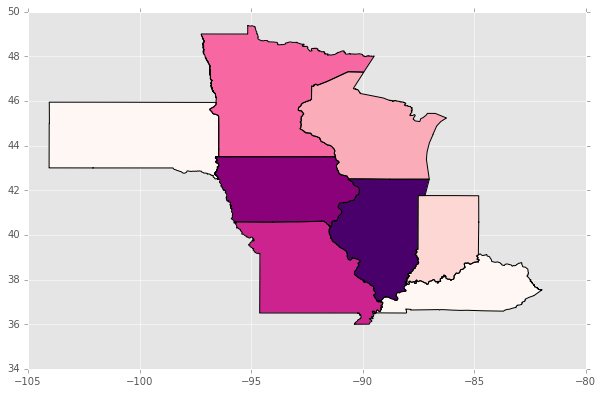

In [44]:
state_loss_df.plot(column='gu_aal', colormap='RdPu', scheme='QUANTILES', alpha=1, k=7, legend=False)

In [48]:
# We can even create on the fly interactive plots!
import mplleaflet
uniquestates=state_loss_df.plot(column='gu_aal', colormap='RdPu', alpha=0.5)
# An interactive, panable, zoomable map.
mplleaflet.display(fig=uniquestates.figure, crs=stdf_unique.crs)

##### Zip Code Analysis <a id="zip"></a>
*Here we will look at ways to aggregate data based on the ELEMENTS provided zip code, but we will also look at different ways to join the point shapefile to a polygon file as well.*

In [51]:
# Let's read this shape in via a ziipped shapefile:
filename = os.path.join('data', 'tl_2014_us_zcta510.zip')
zip_shp = gpd.read_file('/tl_2014_us_zcta510.shp', vfs='zip://' + filename)
print type(zip_shp)
zip_shp.crs

<class 'geopandas.geodataframe.GeoDataFrame'>


{'init': u'epsg:4269'}

In [57]:
# Subset the data by using a list of unique states from our dataframe and selecting only those shapes
ziplist = data.geozip.unique()
print "There are " + str(len(ziplist)) + " unique zipcodes in our analysis"
zip_shp = zip_shp.loc[zip_shp['ZCTA5CE10'].isin(ziplist)]

There are 3821 unique zipcodes in our analysis


In [63]:
zipdf = data[['geozip','gu_aal','lscst_1k']].groupby('geozip').sum()
zipdf = zipdf.reset_index()
zipdf = pd.merge(zipdf, zip_shp, left_on='geozip', right_on='ZCTA5CE10')
zipdf.sort_values('gu_aal', inplace=True, ascending=False)
zipdf = zipdf.drop(['ALAND10','AWATER10','CLASSFP10','FUNCSTAT10','GEOID10','INTPTLAT10','INTPTLON10','MTFCC10'],axis=1)
zipdf.head()

,geozip,gu_aal,lscst_1k,ZCTA5CE10,geometry
3252,63742,"51,649,978.08","303,823.40",63742,"POLYGON ((-89.45085899999999 37.159665, -89.45..."
3039,62962,"44,933,957.43","264,317.40",62962,"POLYGON ((-89.36473599999999 37.134002, -89.36..."
3013,62914,"32,596,652.91","191,745.02",62914,"POLYGON ((-89.19081299999999 37.01373, -89.190..."
3053,62998,"30,476,012.57","179,270.66",62998,"POLYGON ((-89.47190000000001 37.561953, -89.47..."
3035,62957,"24,762,738.75","145,663.17",62957,"POLYGON ((-89.417232 37.334761, -89.416916 37...."


*Let's use Folium this time to make an interactive map.*

In [84]:
zipdf = zipdf.loc[zipdf['gu_aal']>0]
zipdf = gpd.GeoDataFrame(zipdf,crs=fiona.crs.from_epsg(4326),geometry='geometry')
zipdf.crs

{'init': 'epsg:4326', 'no_defs': True}

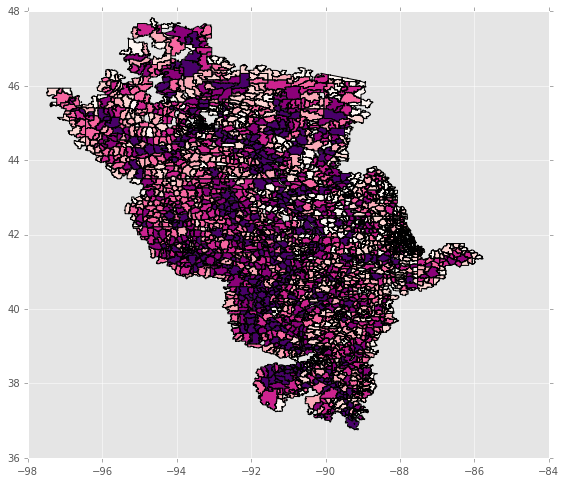

In [85]:
zipdf.plot(column='gu_aal', colormap='RdPu', scheme='QUANTILES', alpha=1, k=7, legend=False)

Centerpoint: -91.6347505 | 42.2916015


## To-Do Section <a id="todo"></a>
**Here's a bunch of stuff I didn't get to**
- Binning example
- Folium example
- Basemap example
- R-Tree Indexing example
- Deeper dive into statistics

In [30]:
# Example of binning
num_colors = len(state_loss_df)-4
values = state_loss_df['gu_aal']
cm = plt.get_cmap('Reds')
scheme = [cm(i / num_colors) for i in range(num_colors)]
bins = np.linspace(values.min(), values.max(), num_colors)
state_loss_df['bin'] = np.digitize(values, bins) - 1
state_loss_df.sort_values('bin', ascending=False).head(10)

,NAME10,STATEFP10,STATENS10,STUSPS10,geometry,gu_aal,lscst_1k,bin
4,Illinois,17,01779784,IL,"POLYGON ((-90.450813 38.967769, -90.451279 38....","1,138,486,239.20","6,696,977.88",3
6,Iowa,19,01779785,IA,"POLYGON ((-94.015492 40.573914, -94.016088 40....","975,661,541.16","5,739,185.54",2
0,Wisconsin,55,01779806,WI,"POLYGON ((-88.776493 42.491912, -88.7765030000...","492,269,820.83","2,895,704.83",1
2,Missouri,29,01779791,MO,"POLYGON ((-90.220732 36.497859, -90.2209249999...","717,634,815.95","4,221,381.27",1
7,Minnesota,27,00662849,MN,"POLYGON ((-96.45298800000001 43.849507, -96.45...","543,613,314.77","3,197,725.38",1
1,Kentucky,21,01779786,KY,"(POLYGON ((-89.554574 36.516456, -89.556702 36...","1,208,334.91","7,107.85",0
3,South Dakota,46,01785534,SD,"POLYGON ((-102.082486 42.999355, -102.082498 4...","7,631,859.76","44,893.29",0
5,Indiana,18,00448508,IN,"POLYGON ((-84.802477 40.572213, -84.802481 40....","22,919,659.22","134,821.52",0


#### Interactive Mapping

##### Folium

In [ ]:
import folium
bds = gpd.GeoSeries(zipdf['geometry']).total_bounds
lon_0 = np.average([bds[0],bds[2]])
lat_0 = np.average([bds[1],bds[3]])
print "Centerpoint: " + str(lon_0) + " | " + str(lat_0)
map = folium.Map(location=[lat_0, lon_0], zoom_start=8, tiles='Stamen Terrain')
folium.GeoJson(zipdf).add_to(map)
map


from folium.colormap import linear

colormap = linear.YlGn.scale(
    unemployment.Unemployment.min(),
    unemployment.Unemployment.max())

print(colormap(5.))

colormap

In [ ]:
bds = gpd.GeoSeries(zipdf['geometry']).total_bounds
map
gjson = zipdf.to_crs(epsg='4326').to_json()
map.choropleth(geo_path=gjson, data=df,
                columns=['State', 'Unemployment'],
                key_on='feature.id',  # Check your GeoJSON for the name!
                fill_color='YlGn', fill_opacity=0.7, line_opacity=0.2,
                legend_name='Unemployment Rate (%)')

##### Basemap

In [45]:
#Now we can import some more libraries and build some maps!
from pysal.esda.mapclassify import Natural_Breaks as nb
from matplotlib.colors import Normalize
from matplotlib.collections import PatchCollection
from mpl_toolkits.basemap import Basemap
from shapely.prepared import prep

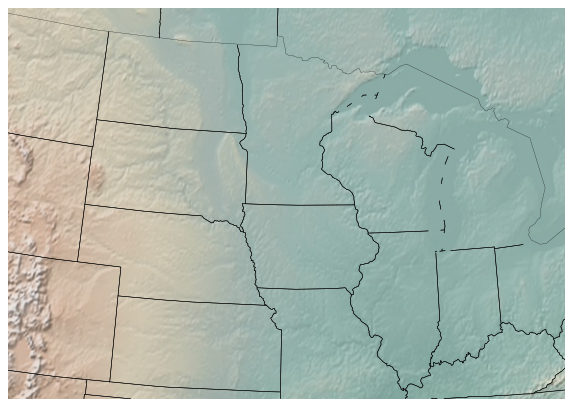

In [46]:
bds = gpd.GeoSeries(state_loss_df['geometry']).total_bounds
#define a variable called extra which we will use for padding the map when we display it (in this case I've selected a 10% pad)
extra = 0.1
#define the lower left hand boundary (longitude, latitude)
ll = (bds[0], bds[1])
#define the upper right hand boundary (longitude, latitude)
ur = (bds[2], bds[3])
#concatenate the lower left and upper right into a variable called coordinates
coords = list(chain(ll, ur))
#define variables for the width and the height of the map
w, h = coords[2] - coords[0], coords[3] - coords[1]
m = Basemap(
    #set projection to 'tmerc' which is apparently less distorting when close-in
    projection='tmerc',
    #set longitude as average of lower, upper longitude bounds
    lon_0 = np.average([bds[0],bds[2]]),
    #set latitude as average of lower,upper latitude bounds
    lat_0 = np.average([bds[1],bds[3]]),
    #string describing ellipsoid (‘GRS80’ or ‘WGS84’, for example). Not sure what this does...
    ellps = 'WGS84',
    #set the map boundaries. Note that we use the extra variable to provide a 10% buffer around the map
    llcrnrlon=coords[0] - extra * w,
    llcrnrlat=coords[1] - extra + 0.01 * h,
    urcrnrlon=coords[2] + extra * w,
    urcrnrlat=coords[3] + extra + 0.01 * h,
    #provide latitude of 'true scale.' Not sure what this means, I would check the Basemap API if you are a GIS guru
    lat_ts=0,
    #resolution of boundary database to use. Can be c (crude), l (low), i (intermediate), h (high), f (full) or None.
    resolution='i',
    #don't show the axis ticks automatically
    suppress_ticks=True)

m.drawcountries(linewidth=0.25)
m.drawstates()
m.shadedrelief()

In [ ]:
# Calculate Jenks natural breaks for density
breaks = nb(state_loss_df[state_loss_df['gu_aal'].notnull()].gu_aal.values, initial=300,k=5)

In [41]:
# We can drill down to the zipcode level if we really wanted too...
df = data.loc[data['stateabbreviation']=='IL']
df = df.drop(['stateabbreviation','geolat','geolon','elevation_cm','elevation_cm'], axis=1)
df.groupby(['geozip']).aggregate([sum, len])

gu_aal                  totaltiv          losscost_1k         
                 sum      len              sum      len         sum      len
geozip                                                                      
46213      36,945.19    71.00    12,070,000.00    71.00      217.32    71.00
60000           0.00    10.00     1,700,000.00    10.00        0.00    10.00
60001       7,976.42   210.00    35,700,000.00   210.00       46.92   210.00
60002      85,676.37   531.00    90,270,000.00   531.00      503.98   531.00
60004       9,021.98    30.00     5,100,000.00    30.00       53.07    30.00
60005         423.54    13.00     2,210,000.00    13.00        2.49    13.00
60006      55,416.08    91.00    15,470,000.00    91.00      325.98    91.00
60007      80,883.41   198.00    33,660,000.00   198.00      475.78   198.00
60008      49,990.64   118.00    20,060,000.00   118.00      294.06   118.00
60009       3,042.78    41.00     6,970,000.00    41.00       17.90    41.00
60010      73,008.13   293.00    49,810,000.00   293.00      429.46   293.00
60011      11,516.75   126.00    21,420,000.00   126.00       67.75   126.00
60012      10,931.10   158.00    26,860,000.00   158.00       64.30   158.00
60013     566,762.53   332.00    56,440,000.00   332.00    3,333.90   332.00
60014       5,216.20   133.00    22,610,000.00   133.00       30.68   133.00
60015     143,172.93    90.00    15,300,000.00    90.00      842.19    90.00
60016     536,833.77   388.00    65,960,000.00   388.00    3,157.85   388.00
60017      11,912.99    89.00    15,130,000.00    89.00       70.08    89.00
60018      21,570.65   103.00    17,510,000.00   103.00      126.89   103.00
60019      41,287.72    31.00     5,270,000.00    31.00      242.87    31.00
60020   1,107,018.75 1,781.00   302,770,000.00 1,781.00    6,511.88 1,781.00
60021     519,988.30   290.00    49,300,000.00   290.00    3,058.75   290.00
60022      61,710.69   160.00    27,200,000.00   160.00      363.00   160.00
60025      30,033.37    38.00     6,460,000.00    38.00      176.67    38.00
60026         268.67     4.00       680,000.00     4.00        1.58     4.00
...              ...      ...              ...      ...         ...      ...
62952  10,077,896.72 3,019.00   513,230,000.00 3,019.00   59,281.75 3,019.00
62956       1,472.39    19.00     3,230,000.00    19.00        8.66    19.00
62957  24,762,738.75 3,939.00   669,630,000.00 3,939.00  145,663.17 3,939.00
62958      55,108.51   252.00    42,840,000.00   252.00      324.17   252.00
62959     704,258.00 1,053.00   179,010,000.00 1,053.00    4,142.69 1,053.00
62961      38,018.29   292.00    49,640,000.00   292.00      223.64   292.00
62962  44,933,957.43 6,200.00 1,054,000,000.00 6,200.00  264,317.40 6,200.00
62964      13,845.04    13.00     2,210,000.00    13.00       81.44    13.00
62966   3,866,748.75   853.00   145,010,000.00   853.00   22,745.58   853.00
62969   1,654,777.46 1,064.00   180,880,000.00 1,064.00    9,733.99 1,064.00
62970      10,989.49   102.00    17,340,000.00   102.00       64.64   102.00
62971     420,653.24   786.00   133,620,000.00   786.00    2,474.43   786.00
62973     626,612.03 1,524.00   259,080,000.00 1,524.00    3,685.95 1,524.00
62974      94,710.25   246.00    41,820,000.00   246.00      557.12   246.00
62975   1,863,407.91   625.00   106,250,000.00   625.00   10,961.22   625.00
62976     604,527.04 1,256.00   213,520,000.00 1,256.00    3,556.04 1,256.00
62983     235,142.54   302.00    51,340,000.00   302.00    1,383.19   302.00
62988     152,499.61   644.00   109,480,000.00   644.00      897.06   644.00
62990   4,782,709.77   626.00   106,420,000.00   626.00   28,133.59   626.00
62992     886,073.31 1,518.00   258,060,000.00 1,518.00    5,212.20 1,518.00
62993     780,020.11 1,136.00   193,120,000.00 1,136.00    4,588.35 1,136.00
62994   1,283,491.92 1,770.00   300,900,000.00 1,770.00    7,549.95 1,770.00
62997      11,120.68    47.00     7,990,000.00    47.00       65.42    47.00
62998  30,

In [96]:
# Let's create a new Dataframe with only points that have AAL values...
df = data.loc[data['gu_aal']>0]
df = df.loc[df['geozip']=='62999']
df.gu_aal.count()

926

Wall time: 39 ms


In [98]:

# Create an index on the two government unit columns we have to speed things up a bit
geo_df.set_index(['stateabbreviation', 'geozip'], inplace=True)
# And sort the index
geo_df.sort_index()
geo_df.head()

geolat  geolon  elevation_cm   gu_aal   totaltiv  \
stateabbreviation geozip                                                     
IL                62999    37.89  -89.03         11285 1,003.23 170,000.00   
                  62999    37.86  -89.07         11065 5,346.17 170,000.00   
                  62999    37.90  -89.02         11518    56.82 170,000.00   
                  62999    37.86  -89.06         11126   786.83 170,000.00   
                  62999    37.88  -89.07         11373    26.98 170,000.00   

                          losscost_1k                              geometry  
stateabbreviation geozip                                                     
IL                62999          5.90             POINT (-89.026 37.885002)  
                  62999         31.45     POINT (-89.06600899999999 37.861)  
                  62999          0.33           POINT (-89.02301 37.903999)  
                  62999          4.63  POINT (-89.06399500000001 37.863998)  
                  62999          0.16             POINT (-89.066986 37.875)

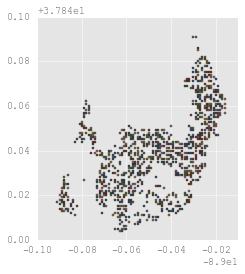

In [99]:
geo_df.plot()